# Pipeline

In [1]:
import torch
import torch.nn as nn
from typing import List, Any
from torch.nn import functional
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as transforms
from PIL import Image
from torchvision.models import resnet18
import os
import json
import numpy as np
from typing import List, Tuple, Any, Dict
import collections
from collections import Counter
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm, trange
from torchsummary import summary
import itertools
import mmdet
from mmcv import Config
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
device

device(type='cuda')

In [2]:
%cd CourseWork/

/home/drapeykonik/CourseWork


## Detection Net (Faster R-CNN)

In [3]:
config = 'mmdetection/configs/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco.py'
cfg = Config.fromfile(config)

In [4]:
from mmdet.apis import set_random_seed

model_type = "faster_rcnn"
# The new config inherits a base config to highlight the necessary modification
#_base_ = '/mmdetection/configs/ssd/ssd300_coco.py'

cfg.data_root = 'autoriaNumberplateDataset-2018-11-20/'
# We also need to change the num_classes in head to match the dataset's annotation
cfg.model.roi_head.bbox_head.num_classes = 1
cfg.model.train_cfg.rpn.sampler.num = 20

# Modify dataset related settings
cfg.dataset_type = 'COCODataset'
classes = ('numberplate',)

cfg.data.train.dataset.img_prefix='autoriaNumberplateDataset-2018-11-20/train/'
cfg.data.train.dataset.classes=classes
cfg.data.train.dataset.ann_file='autoriaNumberplateDataset-2018-11-20/train/numberplate_coco.json'

cfg.data.val.img_prefix='autoriaNumberplateDataset-2018-11-20/val/'
cfg.data.val.classes=classes
cfg.data.val.ann_file='autoriaNumberplateDataset-2018-11-20/val/numberplate_coco.json'

cfg.data.test.img_prefix='autoriaNumberplateDataset-2018-11-20/val/'
cfg.data.test.classes=classes
cfg.data.test.ann_file='autoriaNumberplateDataset-2018-11-20/val/numberplate_coco.json'

cfg.optimizer.lr = 0.02 / 8.  # 3e-3
#cfg.lr_config.warmup = None
cfg.lr_config.policy = 'step'
cfg.lr_config.warmup = 'linear'
cfg.lr_config.warmup_ratio = 1.0 / 1e10

cfg.log_config.interval = 10

# Change the evaluation metric since we use customized dataset.
#cfg.evaluation.metric = 'mAP'
# We can set the evaluation interval to reduce the evaluation times
#cfg.evaluation.interval = 12
# We can set the checkpoint saving interval to reduce the storage cost
cfg.checkpoint_config.interval = 6

# Set seed thus the results are more reproducible
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = [0]
cfg.device = "cuda"

cfg.work_dir = f'./{model_type}_exps'
# We can use the pre-trained Mask RCNN model to obtain higher performance
cfg.load_from = 'faster_rcnn_exps/epoch_12.pth'

In [5]:
print(f'Config:\n{cfg.pretty_text}')

Config:
checkpoint_config = dict(interval=6)
log_config = dict(interval=10, hooks=[dict(type='TextLoggerHook')])
custom_hooks = [dict(type='NumClassCheckHook')]
dist_params = dict(backend='nccl')
log_level = 'INFO'
load_from = 'faster_rcnn_exps/epoch_12.pth'
resume_from = None
workflow = [('train', 1)]
opencv_num_threads = 0
mp_start_method = 'fork'
auto_scale_lr = dict(enable=False, base_batch_size=16)
dataset_type = 'COCODataset'
data_root = 'autoriaNumberplateDataset-2018-11-20/'
img_norm_cfg = dict(
    mean=[103.53, 116.28, 123.675], std=[1.0, 1.0, 1.0], to_rgb=False)
train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations', with_bbox=True),
    dict(
        type='Resize',
        img_scale=[(1333, 640), (1333, 800)],
        multiscale_mode='range',
        keep_ratio=True),
    dict(type='RandomFlip', flip_ratio=0.5),
    dict(
        type='Normalize',
        mean=[103.53, 116.28, 123.675],
        std=[1.0, 1.0, 1.0],
        to_rgb=False),
    

In [6]:
from mmdet.apis import inference_detector, init_detector, show_result_pyplot

checkpoint = 'faster_rcnn_exps/epoch_12.pth'
model_detection = init_detector(cfg, checkpoint, device='cuda:0')

load checkpoint from local path: faster_rcnn_exps/epoch_12.pth


/home/drapeykonik/anaconda3/envs/myenv/lib/python3.9/site-packages/mmdet/datasets/utils.py:66: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  warnings.warn(


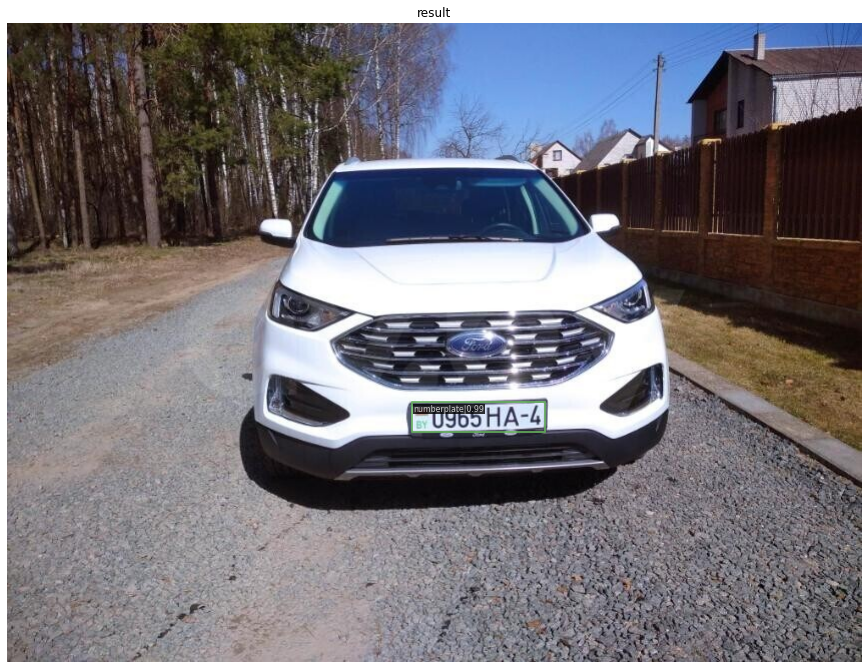

In [7]:
img = "example_images/ex3.jpg"
results = inference_detector(model_detection, img)
show_result_pyplot(model_detection, img, results, score_thr=0.3)

In [8]:
from ocr_exps.label_converter import LabelConverter, decode_batch, decode_prediction
from ocr_exps.ocr_model import OCR

In [9]:
label_converter = LabelConverter(LabelConverter.alphabet, 8, False)
letters = [ch for ch in LabelConverter.alphabet]

In [10]:
model_ocr = OCR(letters, bidirectional=True).to(device)

In [11]:
model_ocr.load_state_dict(torch.load('ocr_exps/ocr_model_lr=0.01_epochs=60_val_acc=0.85.pth'))

<All keys matched successfully>

In [14]:
def predict(image_name, model_detection, model_ocr):
  results = inference_detector(model_detection, image_name)
  show_result_pyplot(model_detection, image_name, results, score_thr=0.3)

  image = Image.open(image_name)
  cropped_images = []
  for bbox_and_conf in results:
    bbox = bbox_and_conf.flatten()[:4]
    cropped_images.append(image.crop(bbox))

  transform = transforms.Compose([transforms.Resize((64, 128)),
                                    transforms.ToTensor()])
  model_ocr.eval()
  with torch.no_grad():
    for cropped_image in cropped_images:  
      logits = model_ocr(transform(cropped_image)[None, :, :, :].to(device))
    pred_text = decode_prediction(logits.cpu(), label_converter)

  title = f'Predicted: {pred_text}'
  plt.imshow(cropped_image)
  plt.title(title, fontdict={"fontsize": 20})
  plt.axis('off');

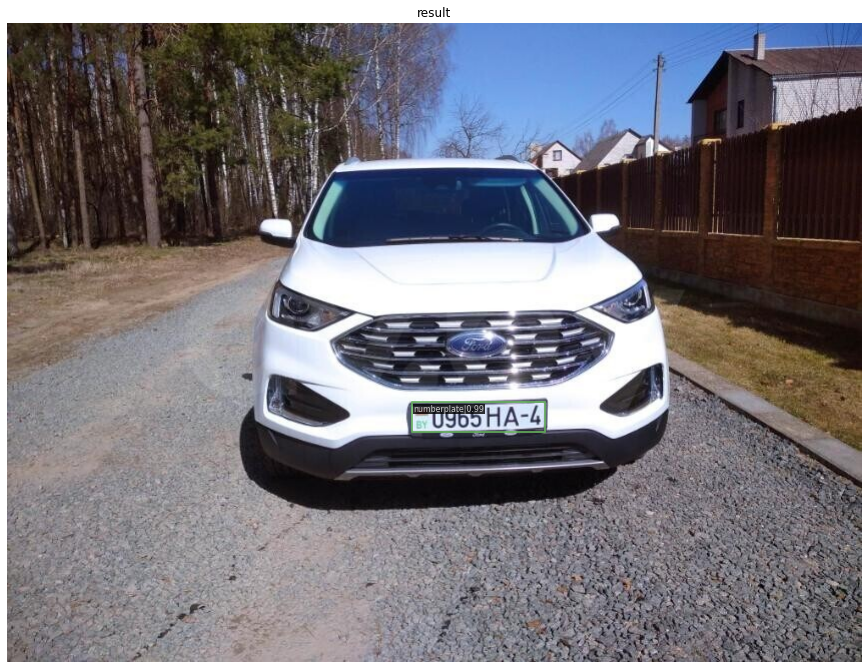

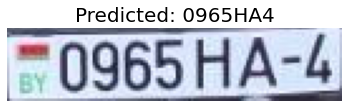

In [15]:
predict("example_images/ex3.jpg", model_detection, model_ocr)

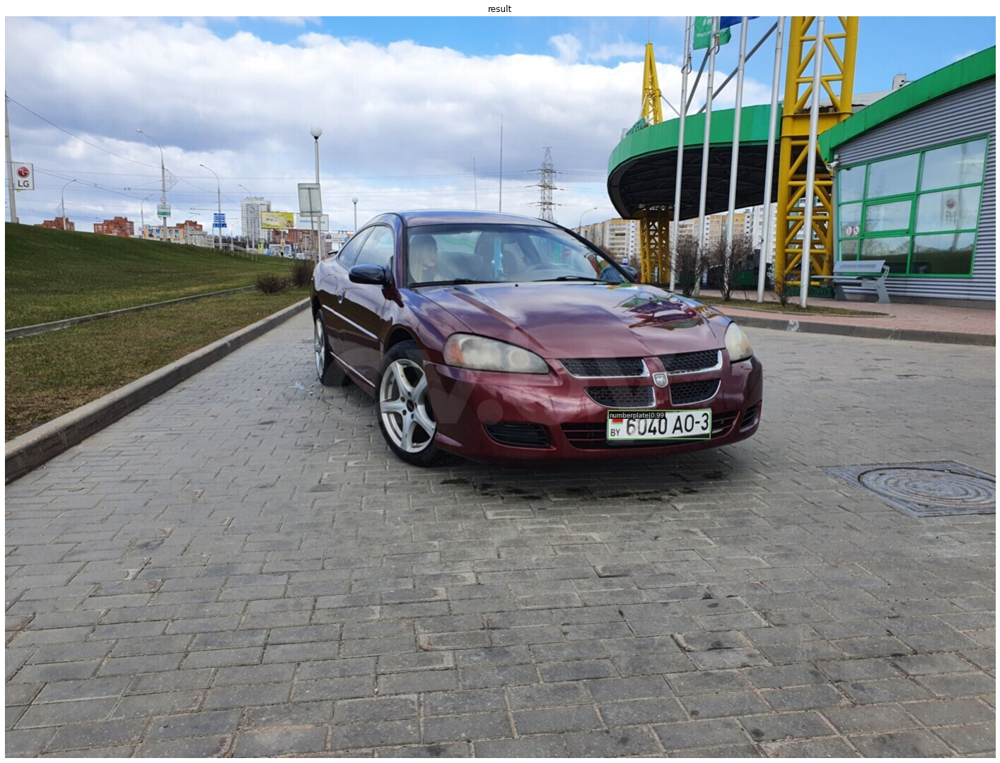

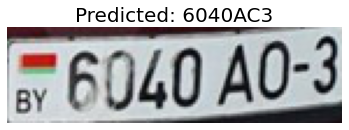

In [16]:
predict("example_images/ex7.jpg", model_detection, model_ocr)

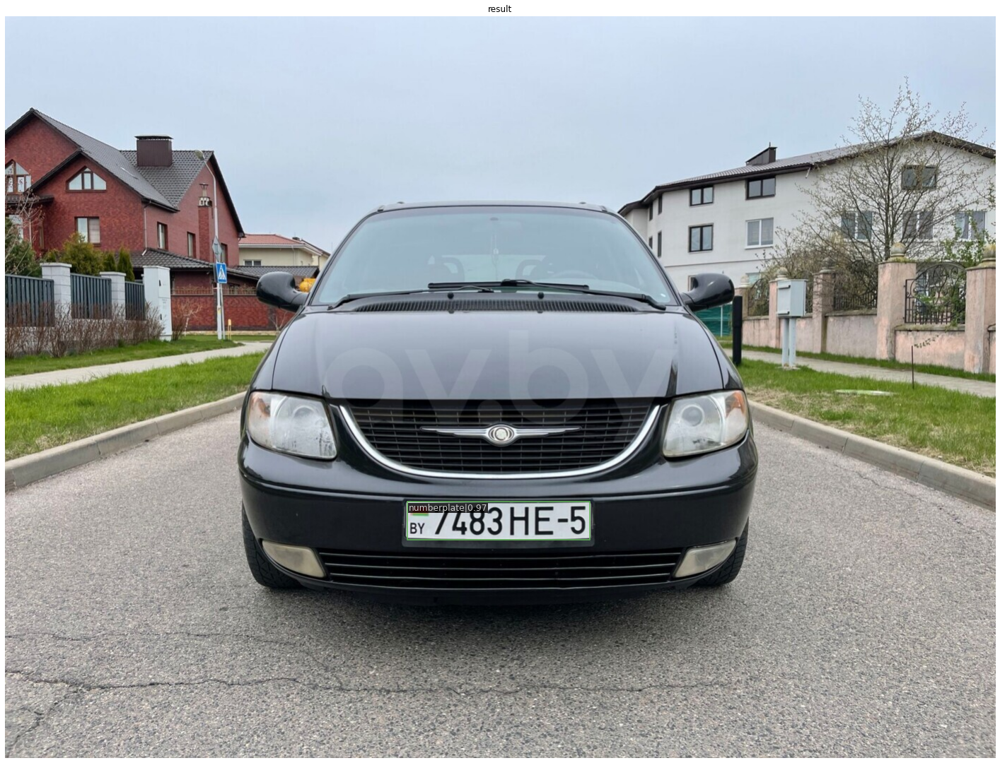

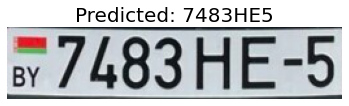

In [17]:
predict("example_images/ex8.jpg", model_detection, model_ocr)

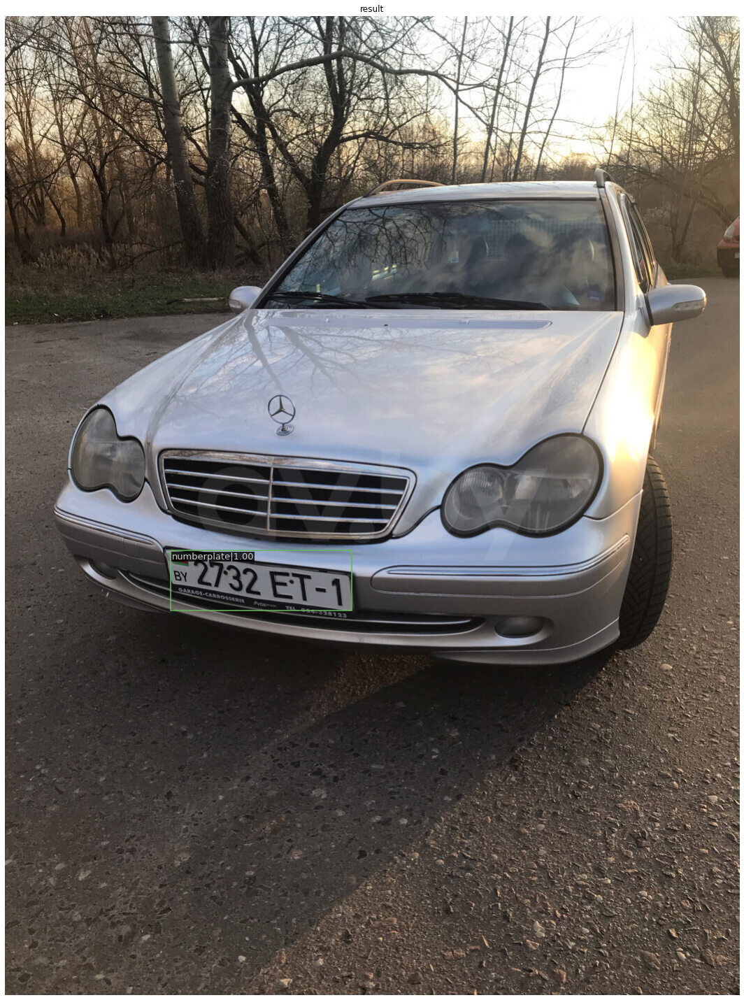

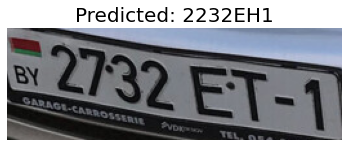

In [18]:
predict("example_images/ex2.jpg", model_detection, model_ocr)

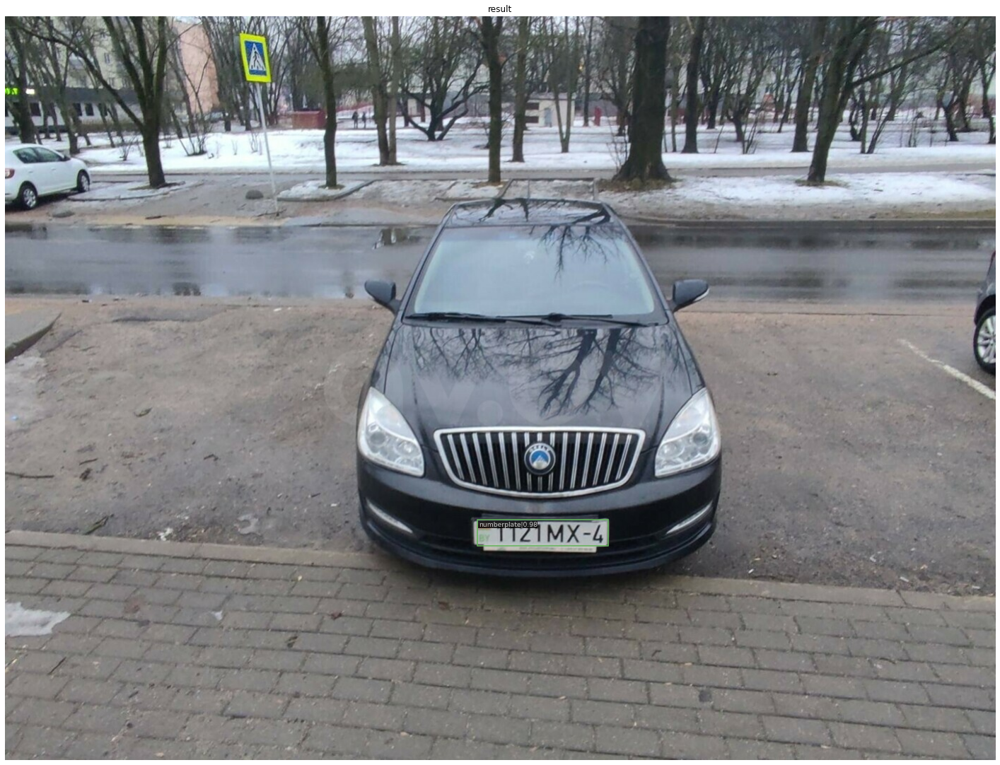

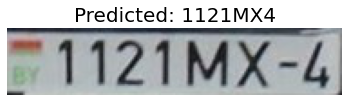

In [20]:
predict("example_images/ex4.jpeg", model_detection, model_ocr)

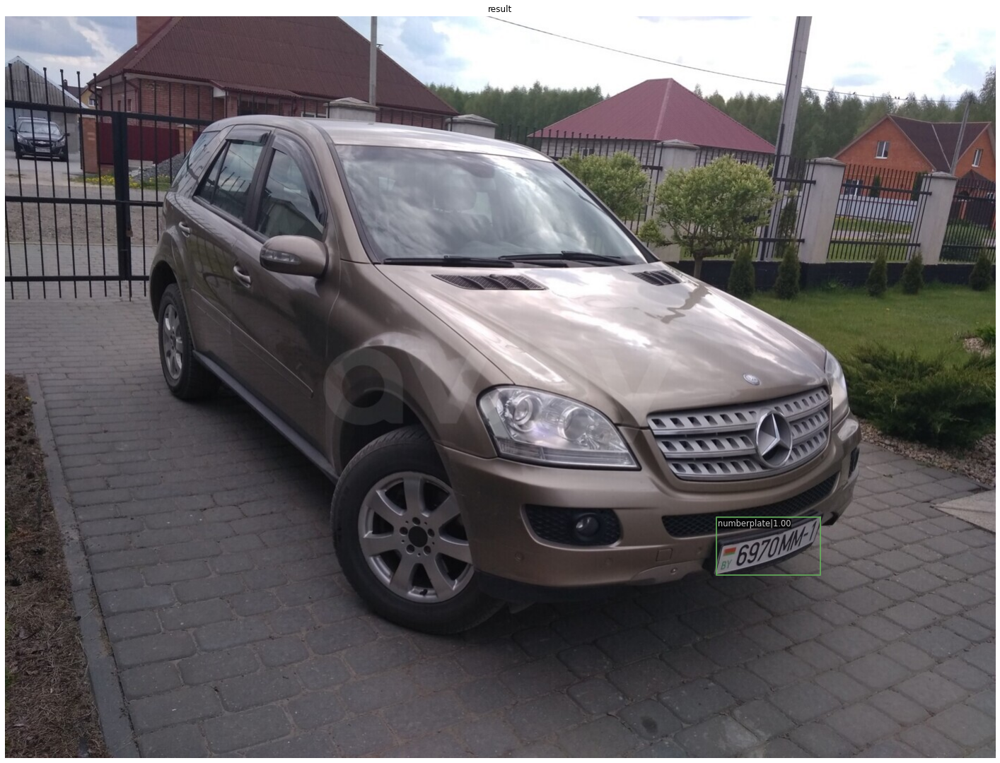

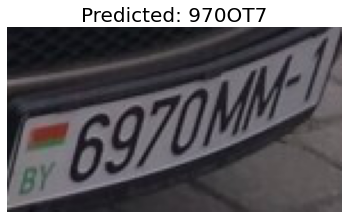

In [21]:
predict("example_images/ex1.jpg", model_detection, model_ocr)